# <b> Table of Content </b>

## <u>Task 1: Data Preparation </u>

### Task 1.1: Import the entire network dataset and a NetworkX graph

### Task 1.2: Import demand dataset & produce the following rankings
- Task 1.2.1: Highest number of arrival and departure of passengers for each station and zones
- Task 1.2.2: Highest number of passengers for non-stepfree stations
- Task 1.2.3: Lowest number of passengers for all stations

### Task 1.3: Generate the following maps
- Task 1.3.1: Geographical structure of the entire network
- Task 1.3.2: Geographical structure of Zone 1
- Task 1.3.3: Map highlighting step-free stations

## <u>Task 2: Data Analysis </u>
- Task 2.2: Use a dictionary of stations with step-free acccess to indicate journeys in demands file that start or end at step-free stations. What proportion is currently step free?

- Task 2.3: Use all_pairs_dijkstra_path() and travel times to obtain a dictionary of shortest paths among all station pairs in the network. 

## <u>Task 3: Selection of Future Stations</u>
- Task 3.2: Implement your model using PuLP and list the stations that are identified by your model.

In [1]:
# Import libraries
import pandas as pd
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import matplotlib.patches as mpatches
from pulp import *

## <u>Task 1: Data Preparation </u>

### Task 1.1: Import the entire network dataset and a NetworkX graph.

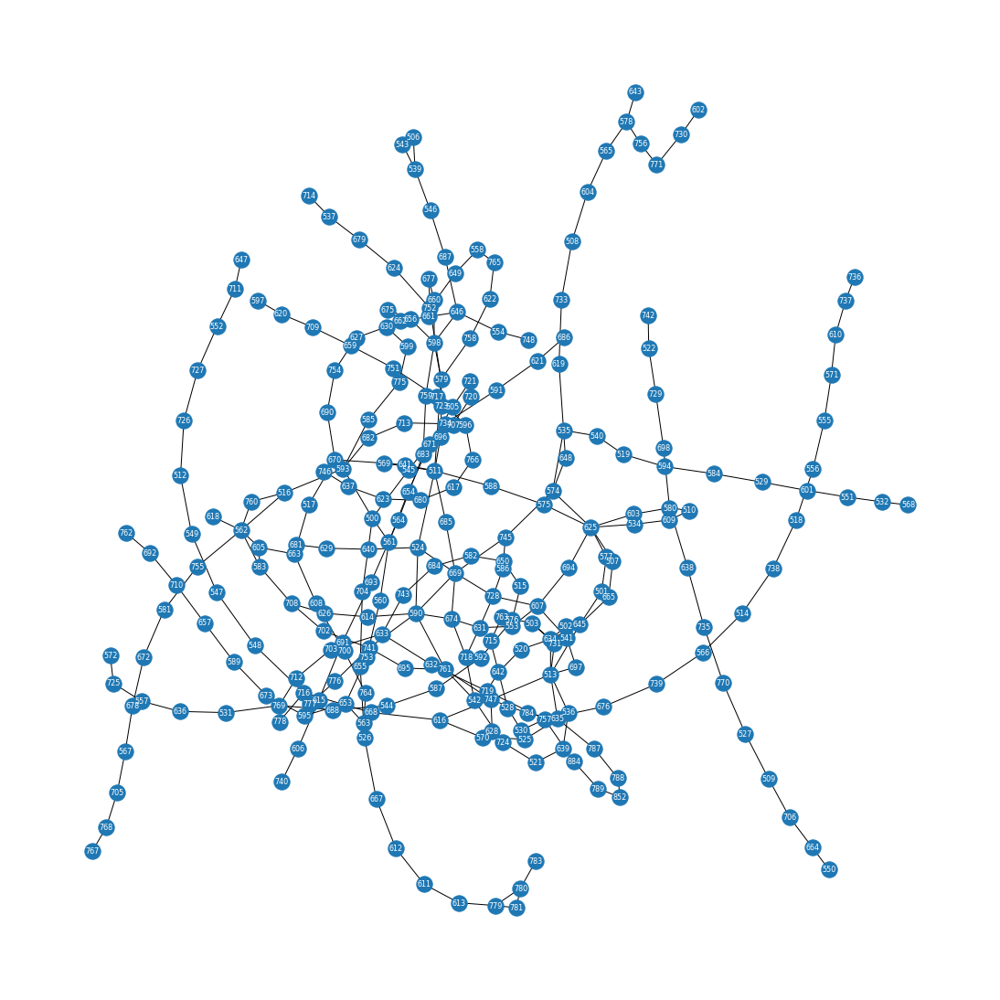

In [2]:
## Task 1.1: Import the entire network dataset
demands = pd.read_csv('demand.csv')
links = pd.read_csv('links.csv')
stations = pd.read_csv('stations.csv')

## Task 1.1: NetworkX graph from links between station
graph_1_1 = nx.Graph()
nodes = stations.id
edges = list(zip(links.station1, links.station2))

graph_1_1.add_nodes_from(nodes)
graph_1_1.add_edges_from(edges)

plt.figure(figsize=(15,15)) 
nx.draw(graph_1_1,with_labels = True, font_color = 'white', node_size=300,font_size=8) 


### Task 1.2: Import demand dataset & produce the following rankings

In [3]:
# Preparing the dataset for the entire section
# Obtaining total number of passengers arriving and departing
departing_passengers = {}
arriving_passengers = {}
for x in stations.id:
    departing_passengers[x] = demands.demand[demands.station1_id == x].sum()
    arriving_passengers[x] = demands.demand[demands.station2_id == x].sum()

# Obtaining the highest number of passengers at each station at any given time
departing_counter = Counter(departing_passengers); arriving_counter = Counter(arriving_passengers)
total_passengers = departing_counter + arriving_counter

# Create new dataframe
data_1_2 = pd.DataFrame()
data_1_2['Station IDs'] = stations.id
data_1_2['Names'] = stations.name
data_1_2['Zones'] = stations.zone
data_1_2['Stepfree'] = stations.stepfree
data_1_2['Arrivals'] = arriving_passengers.values()
data_1_2['Departures'] = departing_passengers.values()
data_1_2['Total_Passengers'] = total_passengers.values()

# View dataset
data_1_2.head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
0,500,Acton Town,3.0,1,22551,22458,45009
1,502,Aldgate,1.0,0,30534,26257,56791
2,503,Aldgate East,1.0,0,51055,56536,107591
3,505,Alperton,4.0,0,11038,10382,21420
4,506,Amersham,10.0,1,3459,4611,8070


- Task 1.2.1: Highest number of arrival and departure of passengers for each station and zones

In [4]:
## Task 1.2.1: Highest number of passengers arriving
data_1_2.sort_values('Arrivals', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
126,625,King's Cross St. Pancras,1.0,1,384616,374478,759094
216,719,Stratford,3.0,1,342897,316349,659246
167,669,Oxford Circus,1.0,0,327946,286007,613953
137,635,London Bridge,1.0,1,316250,334514,650764
242,747,Waterloo,1.0,1,298660,277513,576173


In [5]:
## Task 1.2.1: Highest number of passengers departing
data_1_2.sort_values('Departures', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
126,625,King's Cross St. Pancras,1.0,1,384616,374478,759094
137,635,London Bridge,1.0,1,316250,334514,650764
216,719,Stratford,3.0,1,342897,316349,659246
167,669,Oxford Circus,1.0,0,327946,286007,613953
242,747,Waterloo,1.0,1,298660,277513,576173


In [6]:
## Task 1.2.1: Highest number of passengers departing and arriving
data_1_2.sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
126,625,King's Cross St. Pancras,1.0,1,384616,374478,759094
216,719,Stratford,3.0,1,342897,316349,659246
137,635,London Bridge,1.0,1,316250,334514,650764
167,669,Oxford Circus,1.0,0,327946,286007,613953
242,747,Waterloo,1.0,1,298660,277513,576173


In [7]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 1
data_1_2[data_1_2.Zones <=1.5].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
126,625,King's Cross St. Pancras,1.0,1,384616,374478,759094
137,635,London Bridge,1.0,1,316250,334514,650764
167,669,Oxford Circus,1.0,0,327946,286007,613953
242,747,Waterloo,1.0,1,298660,277513,576173
136,634,Liverpool Street,1.0,1,272128,252678,524806


In [8]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 2
data_1_2[[1.5<= i <=2.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
36,852,Canary Wharf,2.0,1,163679,161105,324784
35,788,Canada Water,2.0,1,135149,150275,285424
93,593,Hammersmith,2.0,1,130606,134943,265549
106,603,Highbury & Islington,2.0,0,133949,127644,261593
236,777,Vauxhall,1.5,1,120702,122382,243084


In [9]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 3
data_1_2[[2.5<= i <=3.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
216,719,Stratford,3.0,1,342897,316349,659246
37,884,Canning Town,3.0,1,132850,135710,268560
154,789,North Greenwich,2.5,1,120752,116436,237188
193,698,Seven Sisters,3.0,0,95714,105465,201179
60,560,Ealing Broadway,3.0,0,71180,71784,142964


In [10]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 4
data_1_2[[3.5<= i <=4.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
245,752,Wembley Park,4.0,1,66428,66947,133375
13,514,Barking,4.0,1,53614,49231,102845
65,566,East Ham,3.5,1,49040,51972,101012
135,633,Leytonstone,3.5,0,38423,38895,77318
185,686,Richmond,4.0,1,44739,31684,76423


In [11]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 5
data_1_2[[4.5<= i <=5.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
98,598,Harrow-on-the-Hill,5.0,1,40987,38069,79056
57,556,Dagenham Heathway,5.0,1,20534,21159,41693
158,657,Northolt,5.0,0,16799,18457,35256
68,568,Edgware,5.0,1,17394,17627,35021
212,714,Stanmore,5.0,1,15045,15043,30088


In [12]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 6
data_1_2[[5.5<= i <=6.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
102,780,Heathrow Terminals 123,6.0,1,37133,40084,77217
235,740,Uxbridge,6.0,1,26538,27608,54146
101,783,Heathrow Terminal 5,6.0,1,21286,22688,43974
73,572,Epping,6.0,1,15325,15380,30705
99,779,Hatton Cross,5.5,0,12136,12263,24399


In [13]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 7
data_1_2[[6.5<= i <=7.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
186,687,Rickmansworth,7.0,0,5763,6094,11857
55,554,Croxley,7.0,0,3107,3292,6399
146,646,Moor Park,6.5,0,2749,2803,5552


In [14]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 8
data_1_2[[7.5<= i <=8.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
243,748,Watford,8.0,0,5758,6006,11764
47,546,Chorleywood,8.0,1,1863,1841,3704


In [15]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 9
data_1_2[[8.5<= i <=9.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
40,539,Chalfont & Latimer,9.0,1,4268,4354,8622


In [16]:
## Task 1.2.1: Highest number of passengers departing and arriving in Zone 10
data_1_2[[9.5<= i <=10.5 for i in data_1_2.Zones]].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
4,506,Amersham,10.0,1,3459,4611,8070
44,543,Chesham,10.0,1,3283,3717,7000


In [17]:
## Task 1.2.1: Highest number of passengers in each zone

data_zone = pd.DataFrame()
# Identify highest demand in each station and attach zones to stations
for zone in pd.unique(data_1_2.Zones):
    # Create new array that only contains the specific zone
    array = data_1_2[data_1_2.Zones == zone]
    # Isolate the row with the maximum total passengers
    iso_array = array.loc[array['Total_Passengers'] == max(array['Total_Passengers'])]
    # Add it to new data frame
    data_zone = data_zone.append(iso_array)

# Output dataframe
data_zone.sort_values('Zones').head(10)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
126,625,King's Cross St. Pancras,1.0,1,384616,374478,759094
236,777,Vauxhall,1.5,1,120702,122382,243084
36,852,Canary Wharf,2.0,1,163679,161105,324784
154,789,North Greenwich,2.5,1,120752,116436,237188
216,719,Stratford,3.0,1,342897,316349,659246
65,566,East Ham,3.5,1,49040,51972,101012
245,752,Wembley Park,4.0,1,66428,66947,133375
98,598,Harrow-on-the-Hill,5.0,1,40987,38069,79056
99,779,Hatton Cross,5.5,0,12136,12263,24399
102,780,Heathrow Terminals 123,6.0,1,37133,40084,77217


- Task 1.2.2: Highest number of passengers for non-stepfree stations


In [18]:
data_1_2[data_1_2.Stepfree == 0].sort_values('Total_Passengers', ascending = False).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
167,669,Oxford Circus,1.0,0,327946,286007,613953
11,513,Bank & Monument,1.0,0,241027,234668,475695
133,631,Leicester Square,1.0,0,169860,186859,356719
74,574,Euston,1.0,0,180200,176314,356514
172,674,Piccadilly Circus,1.0,0,177052,175268,352320


- Task 1.2.3: Lowest number of passengers for all stations

In [19]:
data_1_2.sort_values('Total_Passengers', ascending = True).head(5)

,Station IDs,Names,Zones,Stepfree,Arrivals,Departures,Total_Passengers
187,688,Roding Valley,5.0,1,1452,1278,2730
45,544,Chigwell,5.0,0,1478,1640,3118
47,546,Chorleywood,8.0,1,1863,1841,3704
87,587,Grange Hill,5.0,0,1834,2102,3936
120,618,Kensington (Olympia),2.0,1,1827,3139,4966


### Task 1.3: Generate the following maps
- Task 1.3.1: Geographical structure of the entire network

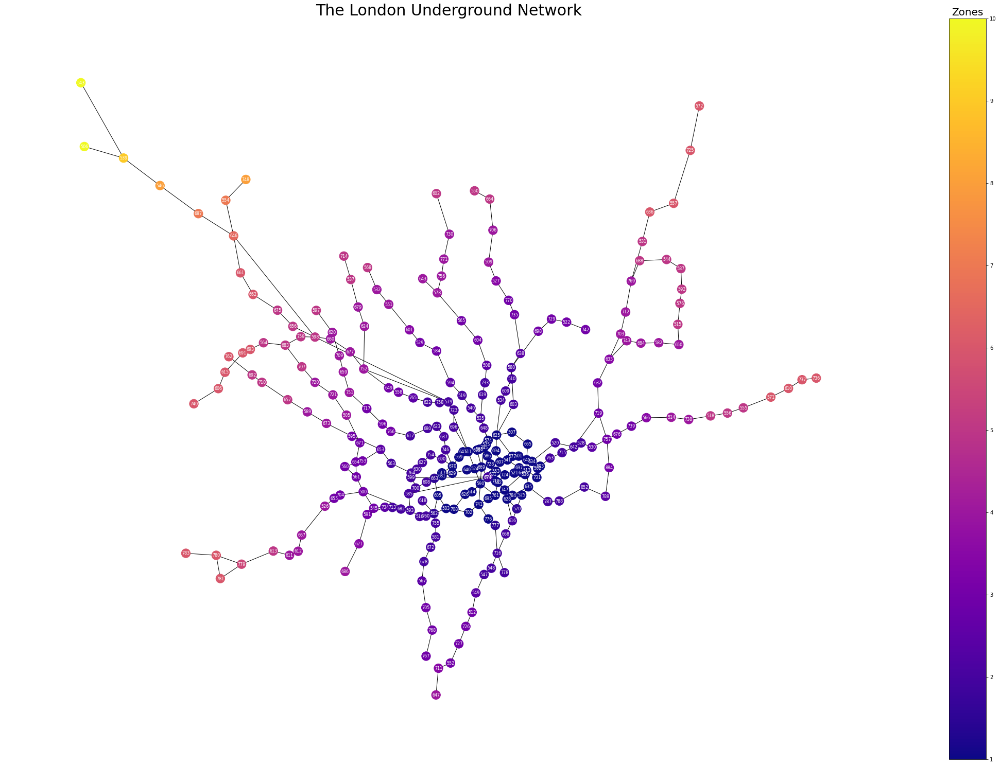

In [20]:
# Import longitude and latitude as tuples
coordinates = list(zip(stations.longitude, stations.latitude))
pos_1_3_1 = dict(zip(nodes, coordinates))
    
# Create network graph
graph_1_3_1 = nx.Graph()
graph_1_3_1.add_nodes_from(nodes)
graph_1_3_1.add_edges_from(edges)
plt.figure(figsize=(30,20)) 

# Create a colorbar for the zones and make nodes look pretty :)
map_colors=range(1,11)
cmap=plt.cm.plasma
nx.draw(graph_1_3_1, pos_1_3_1, cmap = cmap, node_color = [stations.zone], with_labels = True, font_color = 'white', node_size=300, font_size=8)
bar_colours =plt.cm.ScalarMappable(cmap = cmap, norm=plt.Normalize(min(map_colors), max(map_colors)))
cbar = plt.colorbar(bar_colours)

# Labels
plt.title('The London Underground Network', size = 30)
cbar.ax.set_title("Zones", size = 20)  
plt.show()

- Task 1.3.2: Geographical structure of Zone 1

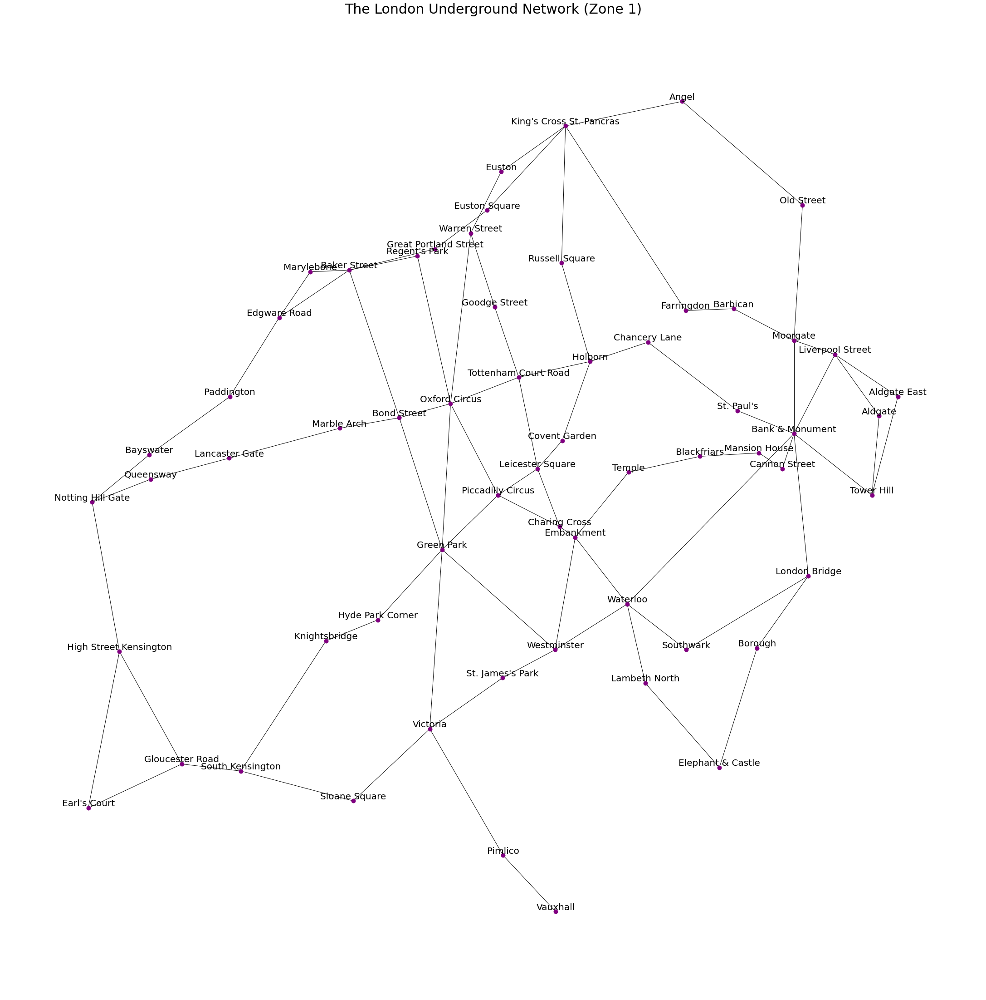

In [21]:
# IDs in Zone 1 only
zone_one_id = stations.id[stations.zone < 2]

# Edges in Zone 1 only
filter_1 = links.loc[links.station1.isin(zone_one_id)]
filter_2 = filter_1.loc[filter_1.station2.isin(zone_one_id)]
edges_1_3_2py= list(zip(filter_2.station1, filter_2.station2))

# Positions of nodes in Zone 1 only
coordinates = list(zip(stations.longitude[stations.zone < 2], stations.latitude[stations.zone < 2]))
pos_1_3_2 = dict(zip(zone_one_id, coordinates))

# Labels for each nodes
labels_1_3_2 = dict(zip(zone_one_id, stations.name[stations.zone < 2] ))
20,
# Draw graph
graph_1_3_2 = nx.Graph()
graph_1_3_2.add_nodes_from(zone_one_id)
graph_1_3_2.add_edges_from(edges_1_3_2py)
plt.figure(figsize=(30,30)) 
nx.draw(graph_1_3_2,pos_1_3_2, labels = labels_1_3_2, with_labels = True, verticalalignment='bottom', font_color = 'black', node_color = 'purple', node_size = 80,font_size=20) 

# Labels
plt.title('The London Underground Network (Zone 1)', size = 30)
plt.show()

- Task 1.3.3: Map highlighting step-free stations

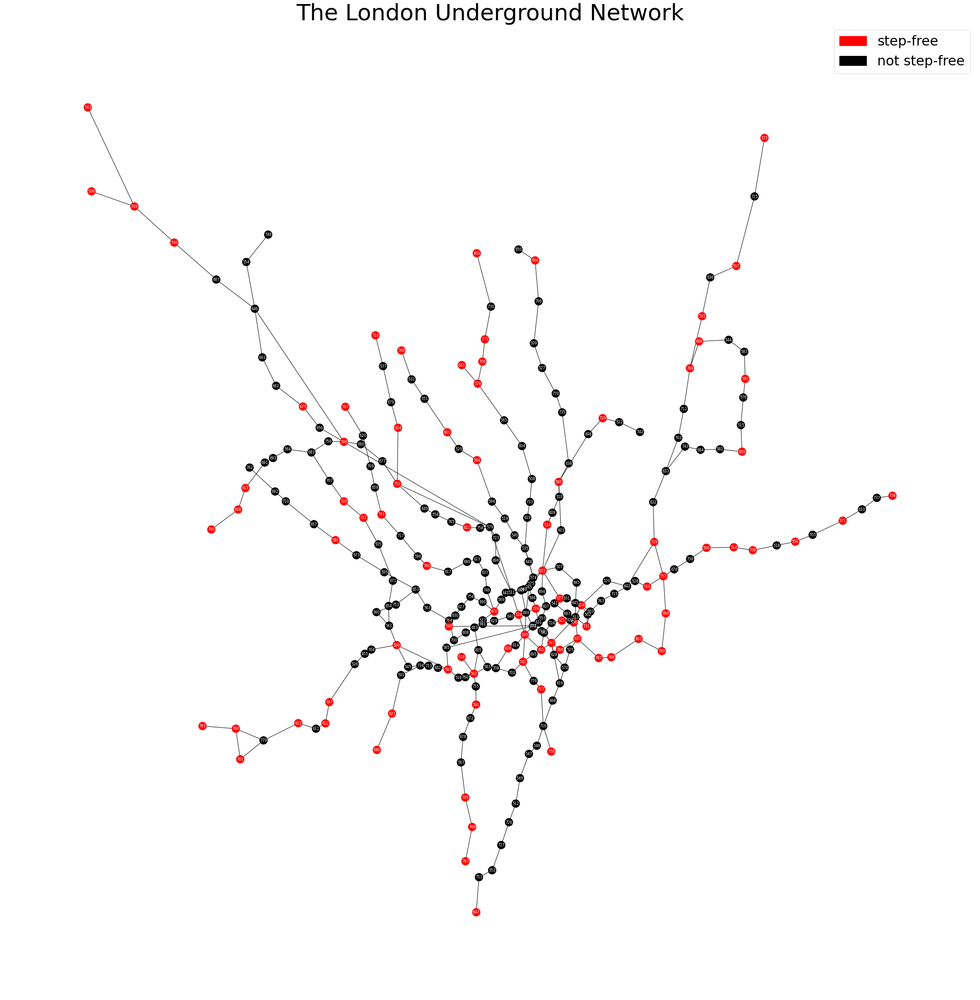

In [22]:
# Create a network
graph_1_3_3 = nx.Graph()
graph_1_3_3.add_nodes_from(nodes)
graph_1_3_3.add_edges_from(edges)
plt.figure(figsize=(30,30)) 

# Identify stations with step-free facilitites
ids_step = list(stations.id [stations.stepfree == 1])

# Specify color of each node
node_colour = ['black' if not nodes in ids_step else 'red' for nodes in graph_1_3_3.nodes()]

# Create a colorbar for the zones and make nodes look pretty :)
nx.draw(graph_1_3_1, pos_1_3_1, node_color = node_colour, with_labels = True, font_color = 'white', node_size=300, font_size=8)

# Labels
red_patch = mpatches.Patch(color='red', label='step-free')
black_patch = mpatches.Patch(color='black', label='not step-free')
plt.legend(handles=[red_patch, black_patch], prop={'size': 30})
plt.title('The London Underground Network', size = 50)
plt.show()


# Task 2: Data Analysis


### Task 2.2: Use a dictionary of stations with step-free acccess to indicate journeys in demands file that start or end at step-free stations. What proportion is currently step free?



In [23]:
# Create a dictionary of stations with step-free access
dict_step_free = dict(zip(stations.id[stations.stepfree == 1], stations.zone[stations.stepfree == 1] ))

# Which journey in demands.csv start or end at a step-free station
journey_part_step_free = demands[demands.station1_id.isin(dict_step_free) | demands.station2_id.isin(dict_step_free)]

# Weekly journeys that are step-free (start and end at a step-free journey)
journey_full_step_free = demands[demands.station1_id.isin(dict_step_free) & demands.station2_id.isin(dict_step_free)]

# Proportion of weekly trips that are step-free (with no consideration of the step-free status of any stations that are used for interchanges)
proportion = journey_full_step_free.demand.sum()/demands.demand.sum()*100
print('The proportion of step free journey is ' + str(proportion) + '%.')

The proportion of step free journey is 23.38610497122991%.


### Task 2.3: Use all_pairs_dijkstra_path() and travel times to obtain a dictionary of shortest paths among all station pairs in the network. 

In [24]:
# Create graph
graph_2_3 = nx.DiGraph() # For directed graphs
graph_2_3.add_edges_from(edges)
graph_2_3.add_nodes_from(nodes)

# Add weights to edges
weights = dict(zip(edges, links.time))
nx.set_edge_attributes(graph_2_3, values=weights, name='weight')

# Find shortest path between each station
shortest_paths = dict(nx.all_pairs_dijkstra_path(graph_2_3))

# Output dictionary
shortest_paths

{500: {500: [500],
  593: [500, 593],
  704: [500, 704],
  561: [500, 561],
  545: [500, 545],
  654: [500, 561, 654],
  560: [500, 561, 560],
  734: [500, 545, 734],
  655: [500, 704, 655],
  671: [500, 561, 654, 671],
  591: [500, 545, 734, 591],
  713: [500, 545, 734, 713],
  753: [500, 561, 560, 753],
  682: [500, 545, 734, 713, 682],
  526: [500, 704, 655, 526],
  516: [500, 593, 516],
  585: [500, 593, 585],
  505: [500, 561, 654, 671, 505],
  621: [500, 545, 734, 591, 621],
  653: [500, 561, 560, 753, 653],
  667: [500, 704, 655, 526, 667],
  562: [500, 593, 516, 562],
  760: [500, 593, 516, 760],
  775: [500, 593, 585, 775],
  721: [500, 561, 654, 671, 505, 721],
  599: [500, 593, 585, 775, 599],
  686: [500, 545, 734, 591, 621, 686],
  563: [500, 561, 560, 753, 653, 563],
  595: [500, 561, 560, 753, 653, 595],
  612: [500, 704, 655, 526, 667, 612],
  583: [500, 593, 516, 562, 583],
  618: [500, 593, 516, 562, 618],
  755: [500, 593, 516, 562, 755],
  605: [500, 593, 516, 562, 

### Task 3.2: Implement your model using PuLP and list the stations that are identified by your model

In [25]:
# Initiate minimizing problem
pulp_stations = LpProblem('problem',LpMaximize) 

# Cost of upgrading each station
cost = np.zeros((len(stations_3_2),1)) # Set all stations to be zero to account for already stepfree stations

for i in range(0,len(stations_3_2)):
    if stations_3_2.zone[i] <= 1.5 and stations.stepfree[i] == 0:
        cost[i] = 10
    elif stations_3_2.zone[i] > 1.5 and stations.stepfree[i] == 0:
        cost[i] = 5

# Form a dictionary for the cost of each stations
station_cost = dict(zip(stations.id, cost))

# Maximum budget for the project
cost_max = 100

# Demand for each journey
journeys = list(zip(demands.station1_id, demands.station2_id))
demand_3_2 = dict(zip(journeys, demands.demand))

# Decision variables
stations_vari = LpVariable.dicts("stations_vari", stations.id, lowBound = 0, upBound = 1, cat = LpInteger) # Station that need to be renovated
journeys_vari = LpVariable.dicts("journeys_vari", demand_3_2, lowBound = 0, upBound = 1, cat = LpInteger) # Journey needs to be maximised

# Define objective equation: maximize demand
pulp_stations += lpSum(journeys_vari[i]*demand_3_2[i] for i in journeys) # lpSum is used to accelerate calculation speed

# Define constraints: cost below 100
pulp_stations += lpSum(stations_vari[i]*station_cost[i] for i in stations.id) <= cost_max

# Relationship between journeys and stations
for station1,station2 in journeys:
    pulp_stations += journeys_vari[(station1,station2)] <= stations_vari[station1] # Station 1 must be stepfree in journey selected to maximize
    pulp_stations += journeys_vari[(station1,station2)] <= stations_vari[station2] # Station 2 must be stepfree in journey selected to maximize
    pulp_stations += journeys_vari[(station1,station2)] >= (stations_vari[station1] + stations_vari[station2] -1) # If Station 1 & 2 stepfree but journey not selected, conditions become dissatisfied

# Solve problem
status = pulp_stations.solve()

NameError: name 'stations_3_2' is not defined

In [ ]:
# Check if solution is optimal

print(f'The solution is: {LpStatus[status]}\n')

print('The number of stepfree journeys are: ',pulp_stations.objective.value())

In [ ]:
# Obtain the IDs of the stations that have to be converted to stepfree and clean string to integer
solution_ids = []
for i in list(stations_vari.values()):
    if i.varValue == 1:
        solution_ids.append(i.name.replace("stations_vari_",""))

# Remove stations that are already stepfree from the list
convert_ids = []
for i in solution_ids:
    if int(i) in list(stations.id[stations.stepfree == 0]):
        convert_ids.append(i)

In [ ]:
# Change ids from string to integers
convert_ids_int = list(map(int, convert_ids))

# Obtain name of stations and associated costs
convert_name = []; convert_cost = []
for i in convert_ids_int:
    convert_name.append(stations.name[stations.id == i].to_string(index=False))
    convert_cost.append(int(cost[stations.id == i]))

# Create dataframe for values
convert_stations = pd.DataFrame()
convert_stations['ID'] = convert_ids
convert_stations['Name'] = convert_name
convert_stations['Cost'] = convert_cost

# Check total cost
print('Total cost of retrofitting all the stations is: ' + str(sum(convert_cost)))
convert_stations

In [ ]:
potential_proportion = (pulp_stations.objective.value()/demands.demand.sum())*100
print('Proportion of stepfree journeys: '+ str(potential_proportion) + '%')